In [1]:
import os
os.chdir("../")

In [3]:
import json
import pickle
from collections import defaultdict
from pathlib import Path
from importlib import reload
import collections.abc as container_abcs

import cv2
import numpy as np
import albumentations as A
from matplotlib import pyplot as plt

from detectron2.engine import DefaultPredictor, DefaultTrainer
from detectron2.data.datasets import register_coco_instances

from src.smear_beta_utils.config import load_config
from src.data_operations import data_augmentation_ops
from src.data_operations import coco_labels_ops
from src.smear_beta_utils.detectron_utils import plot_samples, get_train_cfg

import torch
torch.cuda.empty_cache()

In [4]:
global_config, local_config = load_config()

In [29]:
DATA_AUGMENTATION = False
NUM_ROUNDS = 10
UNICLASS = True
TRAINING = False
MODEL_FOLDER_NAME = "detectron2\\c1_t7_it5000_l001\\"

#### DATA PREPARATION
- Convert labels to uniclass(for the moment)
- Optional data augmentation

In [30]:
with open(
    Path(local_config["PATH"]["coco_labels"]).joinpath("train_transformed.json")
) as file:
    coco_train_labels = json.load(file)

with open(
    Path(local_config["PATH"]["coco_labels"]).joinpath(local_config["FILENAMES"]["coco_test_labels"])
) as file:
    coco_test_labels = json.load(file)

In [31]:
coco_train_labels.keys()

dict_keys(['annotations', 'categories', 'images', 'info', 'licenses'])

DATA AUGMENTATION

In [32]:

if DATA_AUGMENTATION:
    
    num_images = len(coco_train_labels["images"])
    annotations = defaultdict(list, [])
    images = {}
    
    for annot in coco_train_labels["annotations"]:
        annotations[annot["image_id"]].append(annot)

    for img in coco_train_labels["images"]:
        images[img["id"]] = img
        
    last_annot_id = coco_train_labels["annotations"][-1]["id"]+1
    last_image_id = 100000
    
    t_images = images.copy()
    t_annotations = annotations.copy()
    
    for i in range(NUM_ROUNDS):
        for key, values in images.items():
            filename = values["file_name"]
            image = cv2.cvtColor(
                cv2.imread(
                    local_config["PATH"]["coco_routes"]
                    +filename
                ),
                cv2.COLOR_BGR2RGB,
            )
            
            masks = [annot["segmentation"] for annot in annotations[key]]
            bbox = [annot["bbox"] for annot in annotations[key]]
            labels = [annot["category_id"] for annot in annotations[key]]
            
            print(f"BEFORE T IM{key}: Masks {len(masks)}, Boxes {len(bbox)}")
            
            numpy_masks = coco_labels_ops.coco_polygons_to_numpy_masks(
                masks, image.shape[:2]
            )
            
            t_image, t_masks, t_bbox, t_labels = data_augmentation_ops.apply_transform(
                image, numpy_masks, bbox, labels
            )
            
            print(f"AFTER T IM{key}: Masks {len(t_masks)}, Boxes {len(t_bbox)}")

            
            t_masks = coco_labels_ops.numpy_masks_to_coco_polygons(t_masks)
            
            annotations_copy = []
            
            print(f"AFTER TT IM{key}: Masks {len(t_masks)}, Boxes {len(t_bbox)}")
            for j in range(len(t_masks)):
                annot_copy = {}
                annot_copy["area"] = 0
                annot_copy["bbox"] = list(t_bbox[j])
                annot_copy["category_id"] = t_labels[j]
                annot_copy["id"] = last_annot_id
                annot_copy["image_id"] =  last_image_id
                annot_copy["iscrowd"] = 0
                annot_copy["segmentation"] = t_masks[j]

                annotations_copy.append(annot_copy)
                last_annot_id += 1
            
            img_copy = values.copy()
            img_copy["id"] = last_image_id
            img_copy["file_name"] = str(last_image_id)+".jpg"
            img_copy["width"] = t_image.shape[1]
            img_copy["height"] = t_image.shape[0]
            
            cv2.imwrite(
                local_config["PATH"]["coco_routes"] + img_copy["file_name"],
                t_image, 
            )
            
            
            t_annotations[str(last_image_id)] = annotations_copy
            t_images[str(last_image_id)] = img_copy
            
            last_image_id += 1
            
        print(f"Round {i} done!")
    
    
    coco_train_labels_transformed = coco_train_labels.copy()
    coco_train_labels_transformed["annotations"] = [subitem for item in list(t_annotations.values()) for subitem in item]
    coco_train_labels_transformed["images"] = [item for item in list(t_images.values())]
    
    with open(local_config["PATH"]["coco_labels"]+"train_transformed.json", mode="w", encoding="utf-8") as f:
        json.dump(coco_train_labels_transformed, f, ensure_ascii=False, indent=4)
        
    with open(
        Path(local_config["PATH"]["coco_labels"]).joinpath("train_transformed.json")
    ) as file:
        coco_train_labels = json.load(file)

CONVERTING ALL LABELS TO SAME CLASS FOR INITIAL SIMPLICITY

In [33]:
if UNICLASS:
    local_config["FILENAMES"]["coco_train_labels"] = "train_uniclass.json"
    local_config["FILENAMES"]["coco_test_labels"] = "test_uniclass.json"

    for dataset in [coco_train_labels, coco_test_labels]:
        annotations = []
        for annotation in dataset["annotations"]:
            annotation["category_id"] = 1
            annotations.append(annotation)
        dataset["annotations"] = annotations
        dataset["categories"] = [dataset["categories"][0]]
        
    with open(local_config["PATH"]["coco_labels"]+local_config["FILENAMES"]["coco_train_labels"], mode="w", encoding="utf-8") as f:
        json.dump(coco_train_labels, f, ensure_ascii=False, indent=4)
    with open(local_config["PATH"]["coco_labels"]+local_config["FILENAMES"]["coco_test_labels"], mode="w", encoding="utf-8") as f:
        json.dump(coco_test_labels, f, ensure_ascii=False, indent=4)

DETECTRON2 CONFIGURATION

In [36]:
config_file_path = "COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"
checkpoint_url = "COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"
cfg_save_path = local_config["PATH"]["config"]+"hold-detector_cfg.pickle"
output_dir = local_config["PATH"]["models"]+"instance_segmentation\\"+MODEL_FOLDER_NAME
num_classes = 1 if UNICLASS else 2
device = "cuda"
train_dataset_name = "detector_train"
train_images_path = local_config["PATH"]["coco_routes"]
train_annotations_path = local_config["PATH"]["coco_labels"]+local_config["FILENAMES"]["coco_train_labels"]
test_dataset_name = "detector_test"
test_images_path = local_config["PATH"]["coco_routes"]
test_annotations_path = local_config["PATH"]["coco_labels"]+local_config["FILENAMES"]["coco_test_labels"]

In [37]:
register_coco_instances(
    name = train_dataset_name,
    metadata = {},
    json_file = train_annotations_path,
    image_root = train_images_path,
)
register_coco_instances(
    name = test_dataset_name,
    metadata = {},
    json_file = test_annotations_path,
    image_root = test_images_path,
)

In [38]:
cfg = get_train_cfg(
    config_file_path=config_file_path,
    checkpoint_url=checkpoint_url,
    train_dataset_name=train_dataset_name,
    test_dataset_name=test_dataset_name,
    n_classes=num_classes,
    device=device,
    output_dir=output_dir
)
with open(cfg_save_path, "wb") as f:
    pickle.dump(cfg, f, protocol=pickle.HIGHEST_PROTOCOL)

data\\preprocessed\\COCO\\labels\\train_uniclass.json contains 42400 annotations, but only 42395 of them match to images in the file.
Filtered out 10 instances without valid segmentation. There might be issues in your dataset generation process.  Please check https://detectron2.readthedocs.io/en/latest/tutorials/datasets.html carefully


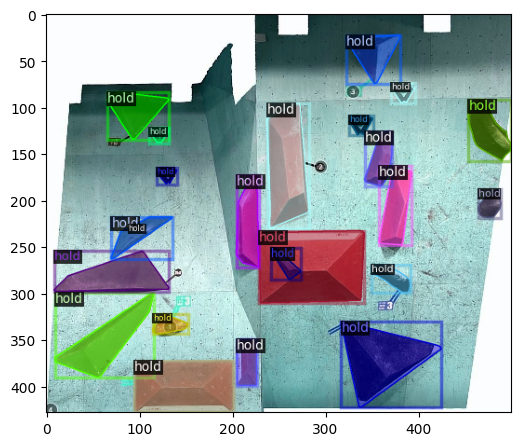

In [39]:
plot_samples(train_dataset_name, n_images=1, image_size=(6,6))

TRAINING

In [40]:
len(coco_train_labels["images"])

1199

In [41]:
if TRAINING:
    trainer = DefaultTrainer(cfg)
    trainer.resume_or_load(resume=False)
    trainer.train()

In [43]:
with open(cfg_save_path, mode="rb") as f:
    cfg = pickle.load(f)
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.85
cfg.MODEL.ROI_HEADS.NMS_THRESH_TEST = 0.4
predictor = DefaultPredictor(cfg)

In [44]:
# for image in coco_test_labels["images"]:
#     image_file = image["file_name"]
#     image_original = cv2.imread(local_config["PATH"]["coco_routes"]+image_file)
#     predicted_image = predict(
#         local_config["PATH"]["coco_routes"]+image_file,
#         predictor,
#     )

#     fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(17,12))
#     ax1.imshow(image_original[:,:,::-1])
#     ax1.axis("off")
#     ax2.imshow(predicted_image)
#     ax2.axis("off")
#     plt.show()

In [45]:
from src.smear_beta_utils.detectron_utils import plot_predictions

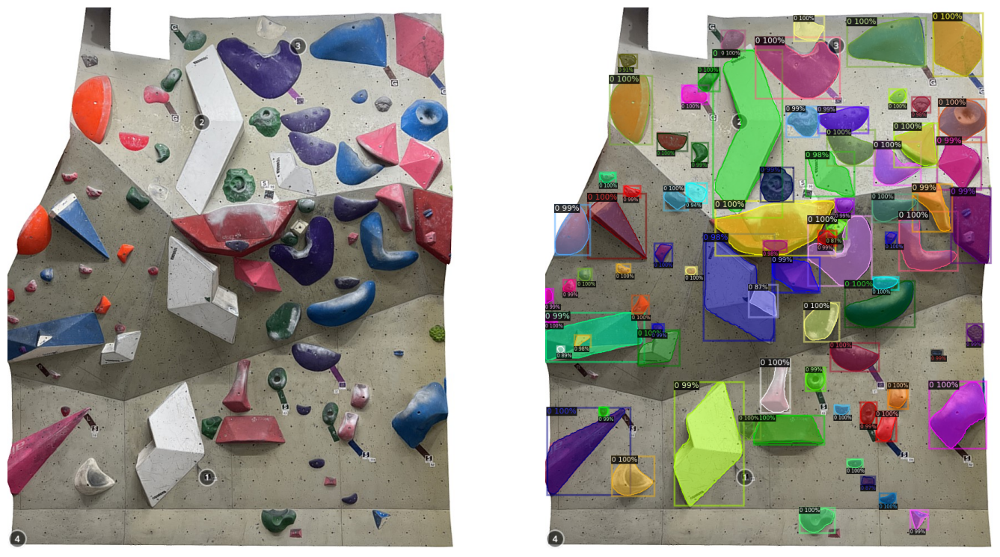

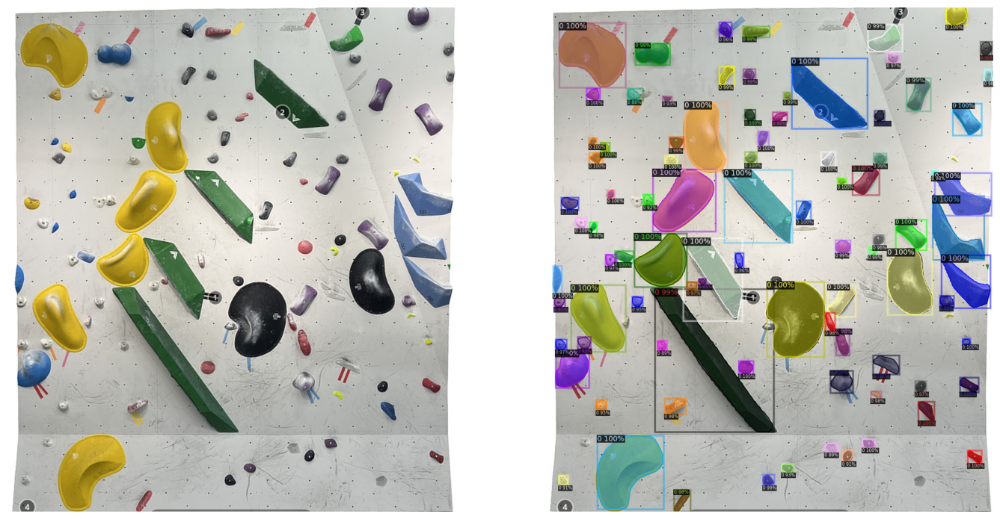

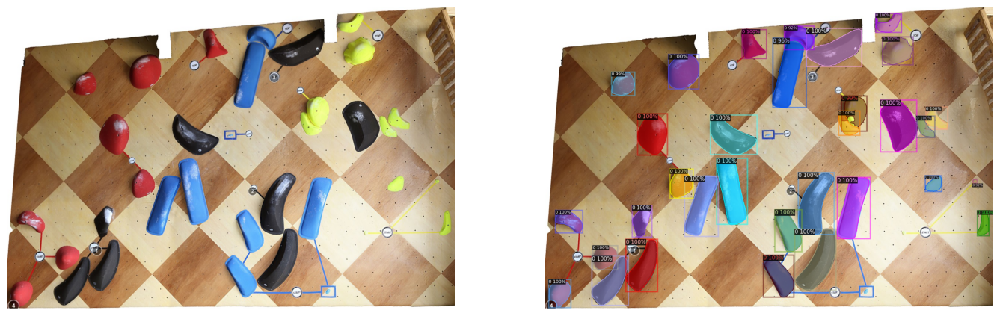

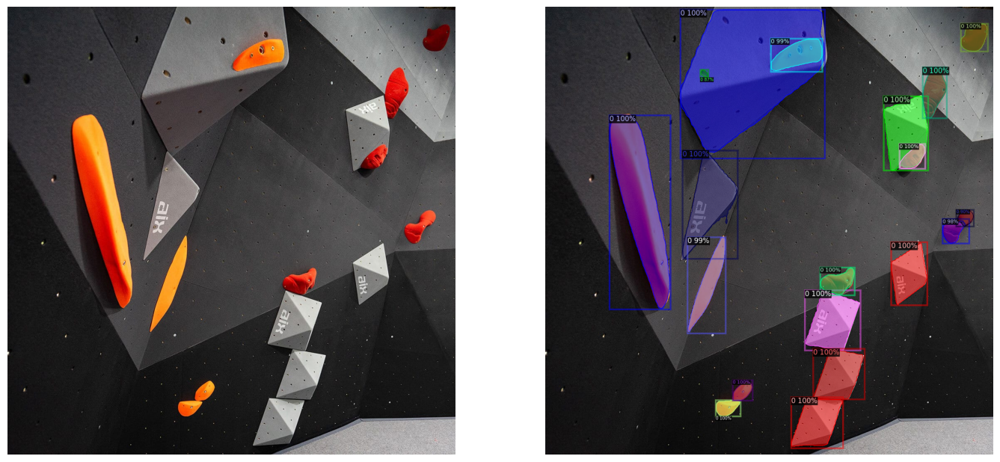

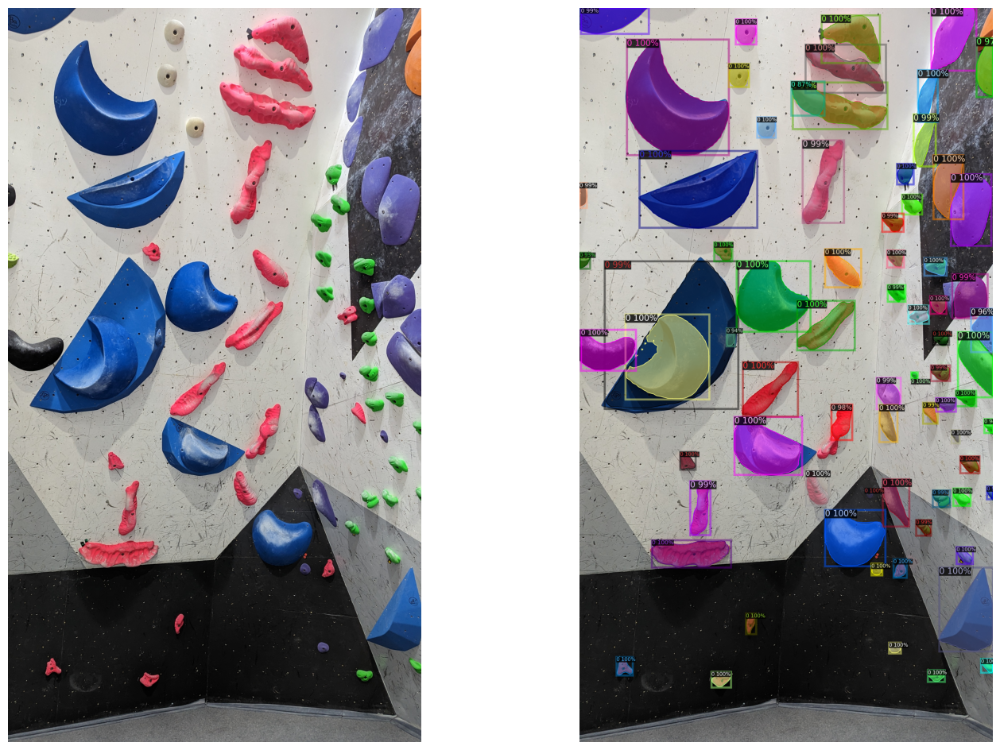

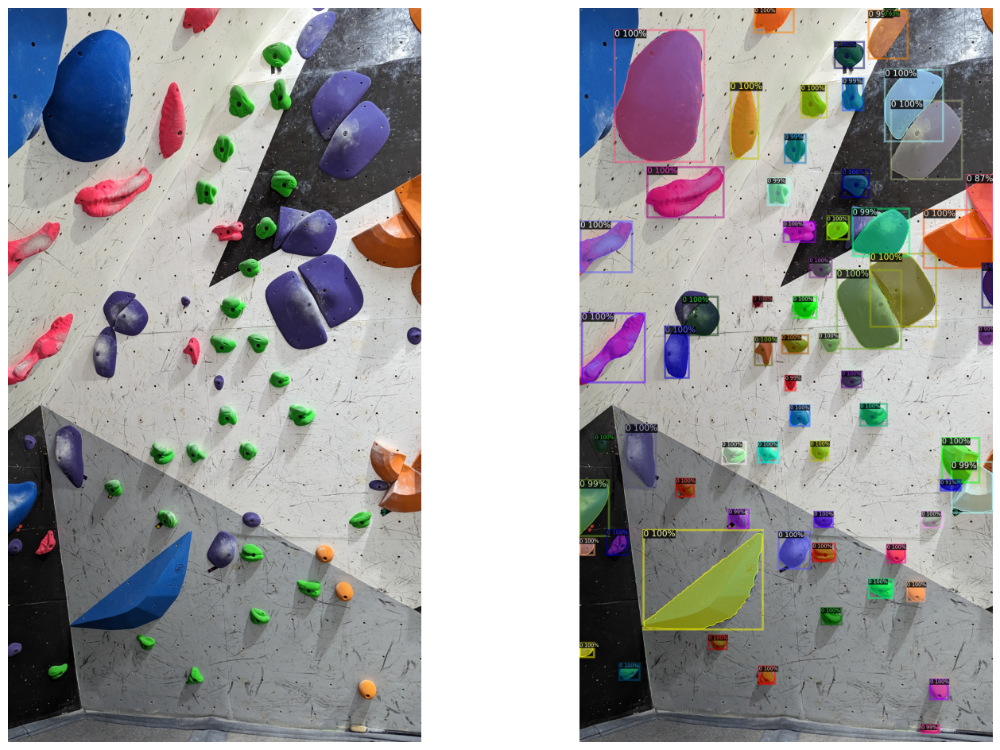

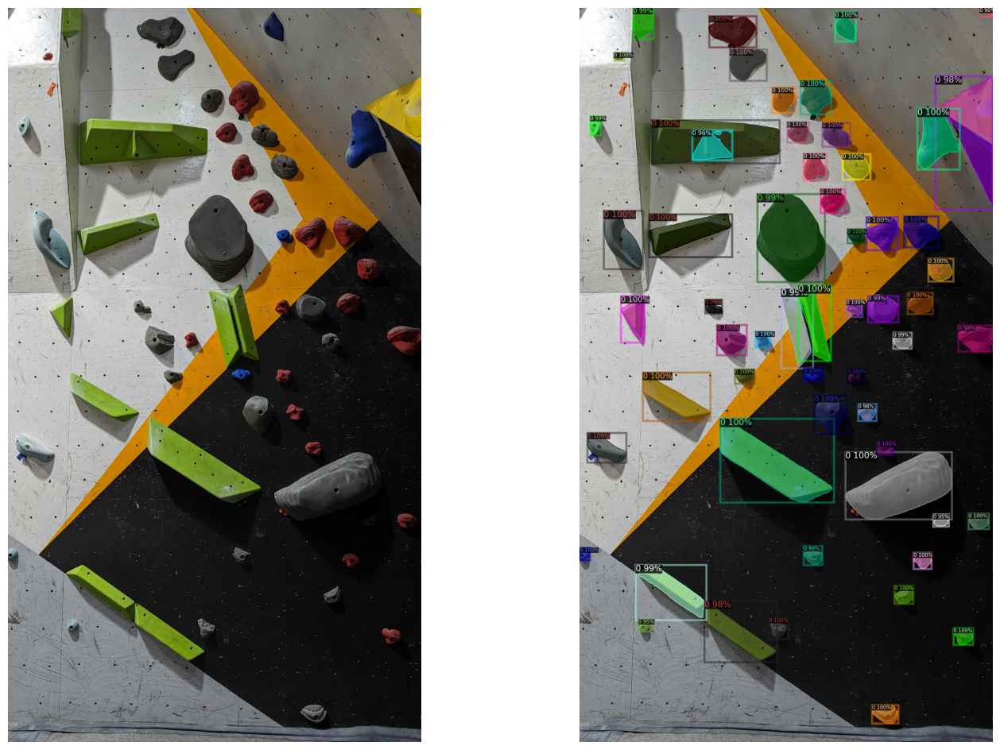

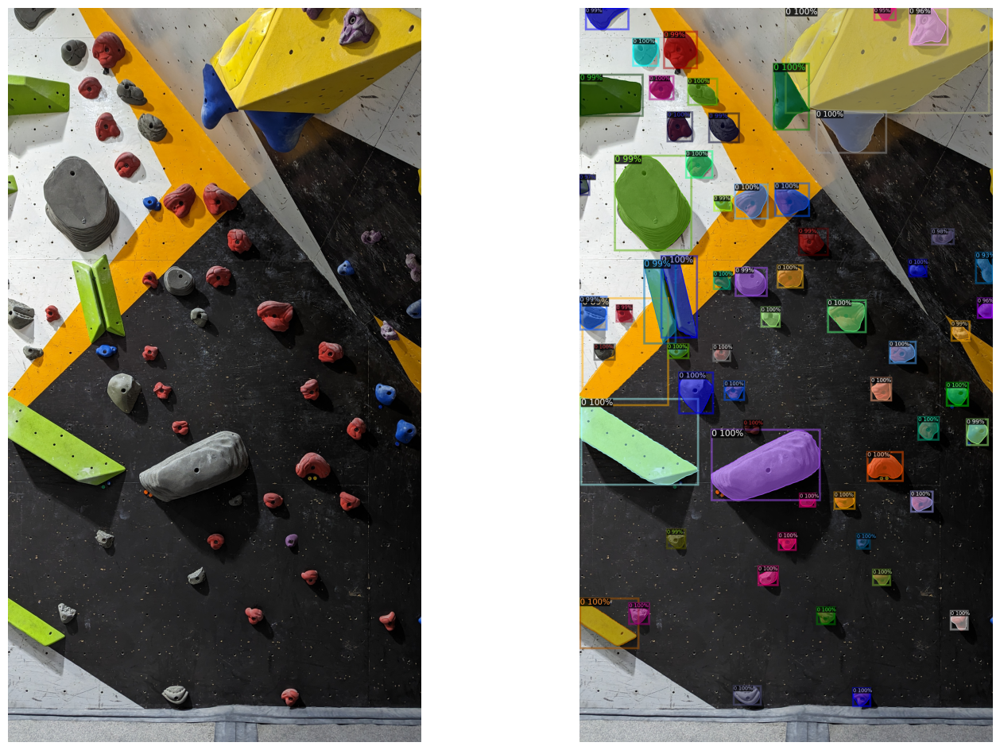

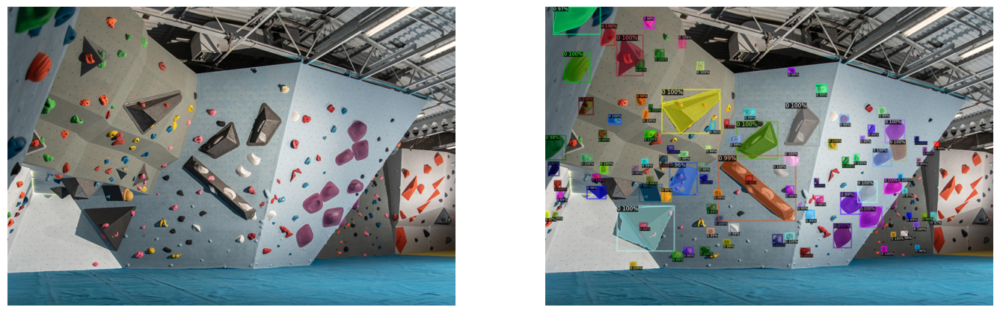

In [47]:
path = Path(local_config["PATH"]["raw_routes"]).joinpath("test_set/")
files = os.listdir(path)
for f in files:
    image_file = f
    image_original = cv2.imread(str(path.joinpath(image_file)))
    predicted_image = image_original.copy()
    predictions = predictor(predicted_image)
    predicted_image = plot_predictions(predicted_image, predictions)
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(17,12))
    ax1.imshow(image_original[:,:,::-1])
    ax1.axis("off")
    ax2.imshow(predicted_image)
    ax2.axis("off")
    plt.show()